## TEST USING THE 5 INSTRU TRACKS AS THE MATRIX TO SEPARATE INSTEAD OF THE ORTF

In [1]:
import numpy as np
import soundfile as sf
import scipy.signal as ss
import matplotlib.pyplot as plt
import IPython.display as ipd
from tqdm.notebook import tqdm
from ssspy.bss.mnmf import GaussMNMF as GaussMNMFBase

# =============================================================================
# Parameters
# =============================================================================
n_fft = 4096
hop_length = 2048
duration_sec = 20  # use the last 20 seconds of each file

# =============================================================================
# 1. Load the singular instrument tracks and form the mixture
# =============================================================================
instrument_files = {
    "basse":  "../data_PAM/real/Fly_me_v2_indiv/Fly_me_v2_BASSE.wav",
    "percus": "../data_PAM/real/Fly_me_v2_indiv/Fly_me_v2_PERCU.wav",
    "piano":  "../data_PAM/real/Fly_me_v2_indiv/Fly_me_v2_PIANO.wav",
    "voix":   "../data_PAM/real/Fly_me_v2_indiv/Fly_me_v2_VOIX.wav",
    "saxo":   "../data_PAM/real/Fly_me_v2_indiv/Fly_me_v2_SAXO.wav"
}

instrument_names = list(instrument_files.keys())
waveforms = []
for name in instrument_names:
    file = instrument_files[name]
    waveform, sr = sf.read(file)  # waveform shape: (n_samples, n_channels)
    last_n_samples = int(sr * duration_sec)
    waveform = waveform[-last_n_samples:]  # take the last 20 seconds
    waveform = waveform.T  # transpose to shape: (n_channels, n_samples)
    waveforms.append(waveform)
    print(f"Loaded {name} with shape {waveform.shape}")

sample_rate = sr  # assume all files share the same sample rate

# Ensure all instrument recordings have the same number of samples
min_samples = min(wave.shape[1] for wave in waveforms)
waveforms = [wave[:, :min_samples] for wave in waveforms]

# Stack into a 3D array of shape (n_channels, n_sources, n_samples)
waveform_src_img = np.stack(waveforms, axis=1)  # here: (2, 5, n_samples)

# Create the mixture by summing the instrument signals (over axis=1)
waveform_mix = np.sum(waveform_src_img, axis=1)  # resulting shape: (2, n_samples)

# Display the mixture channels
for idx, waveform in enumerate(waveform_mix):
    print(f"Mixture channel {idx + 1}:")
    display(ipd.Audio(waveform, rate=sample_rate))
    print()

# =============================================================================
# 2. Compute the STFT of the mixture
# =============================================================================
# The STFT will be computed on the last axis; the mixture is (n_channels, n_samples)
_, _, spectrogram_mix = ss.stft(
    waveform_mix,
    window="hann",
    nperseg=n_fft,
    noverlap=n_fft - hop_length,
    axis=-1
)

# =============================================================================
# 3. Define the GaussMNMF class (with a progress bar)
# =============================================================================
class GaussMNMF(GaussMNMFBase):
    def __init__(self, *args, **kwargs) -> None:
        super().__init__(*args, **kwargs)
        self.progress_bar = None

    def __call__(self, *args, n_iter: int = 100, **kwargs) -> np.ndarray:
        self.n_iter = n_iter
        return super().__call__(*args, n_iter=n_iter, **kwargs)

    def update_once(self) -> None:
        if self.progress_bar is None:
            self.progress_bar = tqdm(total=self.n_iter)
        super().update_once()
        self.progress_bar.update(1)

# =============================================================================
# 4. Apply GaussMNMF to separate 5 sources from the mixture
# =============================================================================
mnmf = GaussMNMF(
    n_basis=30,
    n_sources=5,         # we expect 5 sources (one per instrument)
    partitioning=True,
    rng=np.random.default_rng(42),
)
print(mnmf)

# Run MNMF on the spectrogram of the mixture (using 200 iterations)
spectrogram_est = mnmf(spectrogram_mix, n_iter=200)



Loaded basse with shape (2, 882000)
Loaded percus with shape (2, 882000)
Loaded piano with shape (2, 882000)
Loaded voix with shape (2, 882000)
Loaded saxo with shape (2, 882000)
Mixture channel 1:



Mixture channel 2:



GaussMNMF(n_basis=30, n_sources=5, partitioning=True, normalization=True, record_loss=True, reference_id=0)


  0%|          | 0/200 [00:00<?, ?it/s]

TypeError: istft() got an unexpected keyword argument 'axis'

In [2]:
# =============================================================================
# 5. Reconstruct the time-domain separated sources using the inverse STFT
# =============================================================================
_, waveform_est = ss.istft(
    spectrogram_est,
    window="hann",
    nperseg=n_fft,
    noverlap=n_fft - hop_length,
    time_axis=-1,
    freq_axis=-2
)
# Expected shape of waveform_est: (n_sources, n_samples)

Estimated source 1:


Estimated source 2:


Estimated source 3:


Estimated source 4:


Estimated source 5:


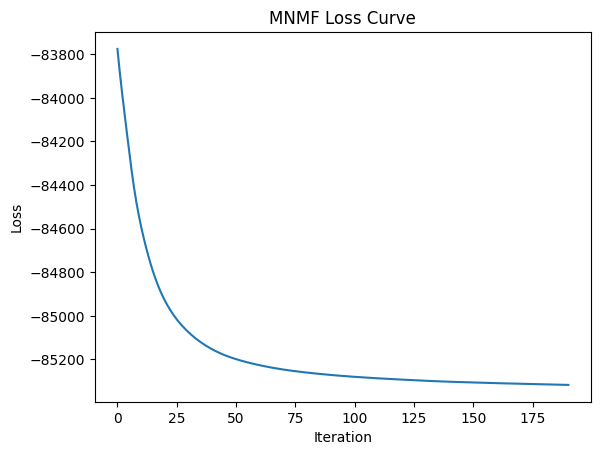

In [3]:
# Display and save the estimated sources
for idx, waveform in enumerate(waveform_est):
    print(f"Estimated source {idx + 1}:")
    display(ipd.Audio(waveform, rate=sample_rate))
    sf.write(f"separated_source{idx + 1}.wav", waveform, sample_rate)

# =============================================================================
# 6. Plot the MNMF loss curve (from iteration 10 onwards)
# =============================================================================
plt.figure()
plt.plot(mnmf.loss[10:])
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("MNMF Loss Curve")
plt.show()
plt.close()


In [ ]:
#----------------------------------------